In [1]:
!nvidia-smi

/bin/bash: nvidia-smi: no se encontró la orden


In [ ]:
!git clone https://github.com/fizyr/keras-retinanet.git

fatal: destination path 'keras-retinanet' already exists and is not an empty directory.


In [ ]:
!pip install --upgrade keras

Requirement already up-to-date: keras in /usr/local/lib/python3.6/dist-packages (2.3.1)


In [27]:
import os
print(os.path.abspath(""))
%cd ../../../../keras-retinanet/

!pip install .

/media/beegfs/home/u271/u271847/computervision/computervision/detection/retina_net
/media/beegfs/home/u271/u271847/keras-retinanet
Processing /media/beegfs/home/u271/u271847/keras-retinanet
  Preparing metadata (setup.py) ... done
  Using cached keras-resnet-0.2.0.tar.gz (9.3 kB)
  Preparing metadata (setup.py) ... done
  Using cached progressbar2-4.2.0-py2.py3-none-any.whl (27 kB)
  Using cached python_utils-3.4.5-py2.py3-none-any.whl (23 kB)
  Created wheel for keras-retinanet: filename=keras_retinanet-1.0.0-cp310-cp310-linux_x86_64.whl size=124931 sha256=a67201be43245119a0854cd8c53c851804d3a02beb8e561c78dde47a19e9099b
  Stored in directory: /media/beegfs/home/u271/u271847/.cache/pip/wheels/de/d6/ab/63c01d07ca6388796717fb3eb56c31bda82af515b9f2a97af6
  Created wheel for keras-resnet: filename=keras_resnet-0.2.0-py2.py3-none-any.whl size=20461 sha256=5bbef85600a14db083b3566753b41b3a76df6dcf095a8d152e6052cfba3f640f
  Stored in directory: /media/beegfs/home/u271/u271847/.cache/pip/wheels

In [ ]:
!python setup.py build_ext --inplace

running build_ext
skipping 'keras_retinanet/utils/compute_overlap.c' Cython extension (up-to-date)
copying build/lib.linux-x86_64-3.6/keras_retinanet/utils/compute_overlap.cpython-36m-x86_64-linux-gnu.so -> keras_retinanet/utils


In [ ]:
!pip install gdown
!pip install tensorflow-gpu

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
from pandas.plotting import register_matplotlib_converters
from sklearn.model_selection import train_test_split
import urllib
import os
import csv
import cv2
import time
from PIL import Image

from keras_retinanet import models
from keras_retinanet.utils.image import read_image_bgr, preprocess_image, resize_image
from keras_retinanet.utils.visualization import draw_box, draw_caption
from keras_retinanet.utils.colors import label_color

%matplotlib inline
%config InlineBackend.figure_format='retina'

register_matplotlib_converters()
sns.set(style='whitegrid', palette='muted', font_scale=1.5)

rcParams['figure.figsize'] = 22, 10

RANDOM_SEED = 42

np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

2023-01-22 12:38:13.222459: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-22 12:38:17.446679: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-01-22 12:38:17.732281: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-01-22 12:38:17.732313: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if yo

In [ ]:
!gdown --id 1mTtB8GTWs74Yeqm0KMExGJZh1eDbzUlT --output indian_number_plates.json

Downloading...
From: https://drive.google.com/uc?id=1mTtB8GTWs74Yeqm0KMExGJZh1eDbzUlT
To: /content/keras-retinanet/indian_number_plates.json
100% 92.5k/92.5k [00:00<00:00, 81.3MB/s]


In [ ]:
os.makedirs("snapshots", exist_ok=True)

In [ ]:
!gdown --id 1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R --output snapshots/resnet50_csv_10.h5

Downloading...
From: https://drive.google.com/uc?id=1wPgOBoSks6bTIs9RzNvZf6HWROkciS8R
To: /content/keras-retinanet/snapshots/resnet50_csv_10.h5
249MB [00:01, 167MB/s]


In [ ]:
plates_df = pd.read_json('indian_number_plates.json', lines=True)

In [ ]:
os.makedirs("number_plates", exist_ok=True)

XVIEW DATASET

In [2]:
import numpy as np
import uuid
from PIL import Image

XVIEW_CATEGORIES = {13: 'CARGO_PLANE', 15: 'HELICOPTER', 18: 'SMALL_CAR', 19: 'BUS', 23: 'TRUCK', 41: 'MOTORBOAT', 47: 'FISHING_VESSEL', 60: 'DUMP_TRUCK', 64: 'EXCAVATOR', 73: 'BUILDING', 86: 'STORAGE_TANK', 91: 'SHIPPING_CONTAINER'}

class GenericObject:
    """
    Generic object data.
    """
    def __init__(self):
        self.id = uuid.uuid4()
        self.bb = (-1, -1, -1, -1)
        self.category = -1
        self.score = -1

class GenericImage:
    """
    Generic image data.
    """
    def __init__(self, filename):
        self.filename = filename
        self.tile = np.array([-1, -1, -1, -1])  # (pt_x, pt_y, pt_x+width, pt_y+height)
        self.objects = list([])

    def add_object(self, obj: GenericObject):
        self.objects.append(obj)


def load_filename(path, line, main_imgs_dir):
    parts = line.strip().split(';')
    image = GenericImage(parts[0])
    num_predictions = int(parts[1])
    img_filepath = os.path.abspath(os.path.join(main_imgs_dir, image.filename))
    if not os.path.exists(img_filepath):
        raise ValueError()
    image.filename = img_filepath
    width, height = Image.open(img_filepath).size
    image.tile = np.array([0, 0, width, height])
    image.width = width
    image.height = height
    image.gsd = 0.3
    for idx in range(0, num_predictions):
        obj = GenericObject()
        obj.id = int(parts[(3*idx)+2])
        pts = parts[(3*idx)+3].split(',')
        obj.bb = (int(pts[0]), int(pts[1]), int(pts[2]), int(pts[3]))
        cat = int(parts[(3*idx)+4])
        if cat not in XVIEW_CATEGORIES.keys():
            continue
        obj.category = XVIEW_CATEGORIES[cat]
        obj.score = 1.0
        image.add_object(obj)
    return image


def load_database_txt(anns_file, main_imgs_dir):
    pos = anns_file.rfind('/') + 1
    path = anns_file[:pos]
    with open(anns_file, 'r', encoding='utf-8') as ifs:
        lines = ifs.readlines()
        anns = []
        for i in range(len(lines)):
            parts = lines[i].strip().split(';')
            if parts[0] == '#' or parts[0] == '@':
                continue
            anns.append(load_filename(path, lines[i], main_imgs_dir))
    ifs.close()
    return anns


xview_dir = '../../../../PROJECT/xview_detection'
anns_file = os.path.abspath(os.path.join(xview_dir, f"xview_ann_train.txt"))

print('Open annotations file: ' + str(anns_file))
if os.path.isfile(anns_file):
    anns = load_database_txt(anns_file, xview_dir)
else:
    raise ValueError('Annotations file does not exist')
print(f'Number of train images: {len(anns)}')

Open annotations file: /media/beegfs/home/u271/u271847/computervision/computervision/PROJECT/xview_detection/xview_ann_train.txt


ValueError: Annotations file does not exist

In [3]:
dataset = dict()
dataset["image_name"] = list()
dataset["x_min"] = list()
dataset["y_min"] = list()
dataset["x_max"] = list()
dataset["y_max"] = list()
dataset["class_name"] = list()

# Get via_csv_row attributes
counter = 0
for ann in anns:
    # Get image ID
    image_id = os.path.splitext(os.path.basename(ann.filename))[0]

    # Iterate over each object
    for obj in ann.objects:
        dataset["image_name"].append(ann.filename)
        x1, y1, x2, y2 = obj.bb
        dataset["x_min"].append(x1)
        dataset["y_min"].append(y1)
        dataset["x_max"].append(x2)
        dataset["y_max"].append(y2)
        dataset["class_name"].append(obj.category)

        counter += 1


print("Counted {} labels.".format(counter))

NameError: name 'anns' is not defined

In [47]:
import pandas as pd
df = pd.DataFrame(dataset)
df.head()

,image_name,x_min,y_min,x_max,y_max,class_name
0,/media/beegfs/home/u271/PROJECT/xview_detectio...,652,2,673,12,MOTORBOAT
1,/media/beegfs/home/u271/PROJECT/xview_detectio...,747,15,771,40,BUILDING
2,/media/beegfs/home/u271/PROJECT/xview_detectio...,618,33,630,49,MOTORBOAT
3,/media/beegfs/home/u271/PROJECT/xview_detectio...,-33,2064,46,2128,BUILDING
4,/media/beegfs/home/u271/PROJECT/xview_detectio...,-29,2176,31,2273,BUILDING


In [48]:
def show_image_objects(image_row):

  img_path = image_row.image_name
  box = [
    image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
  ]

  image = read_image_bgr(img_path)

  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  draw_box(draw, box, color=(255, 255, 0))

  plt.axis('off')
  plt.imshow(draw)
  plt.show()

/media/beegfs/home/u271/PROJECT/xview_detection/train/2606.tif
True


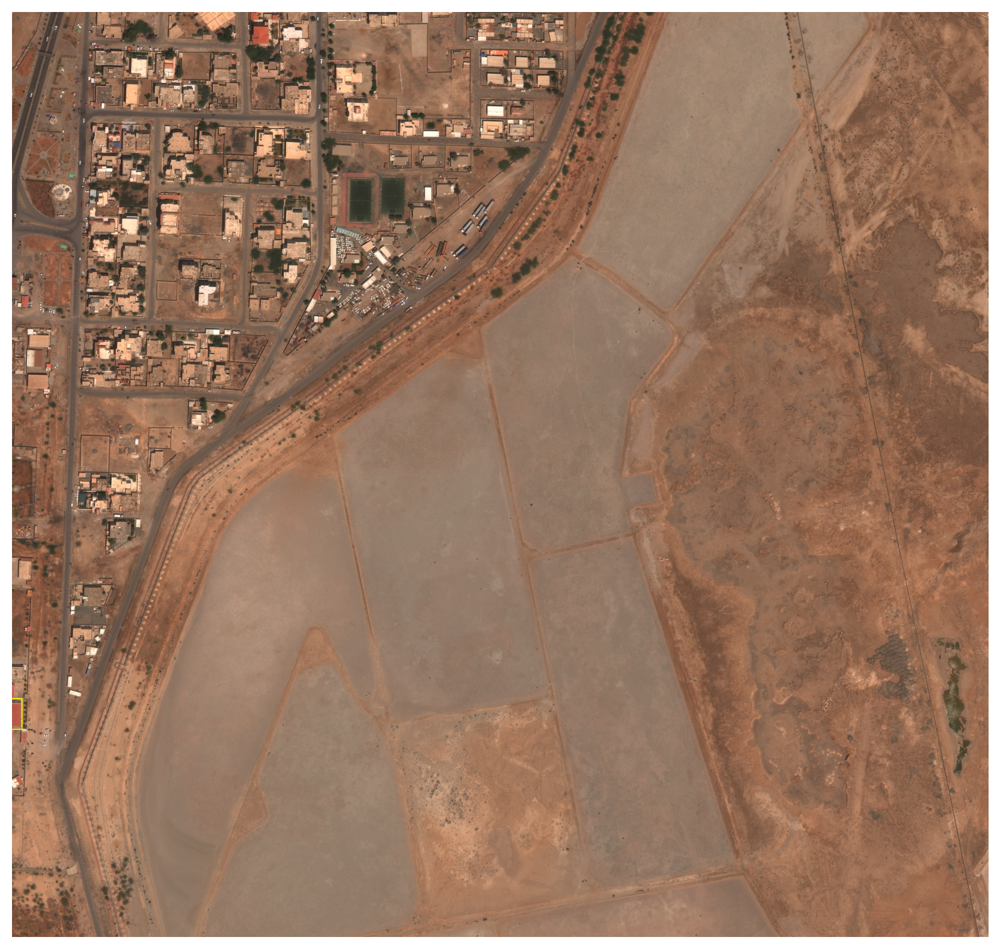

In [51]:
print(os.path.abspath(df.iloc[4].image_name))
print(os.path.exists(os.path.abspath(df.iloc[0].image_name)))
show_image_objects(df.iloc[4])

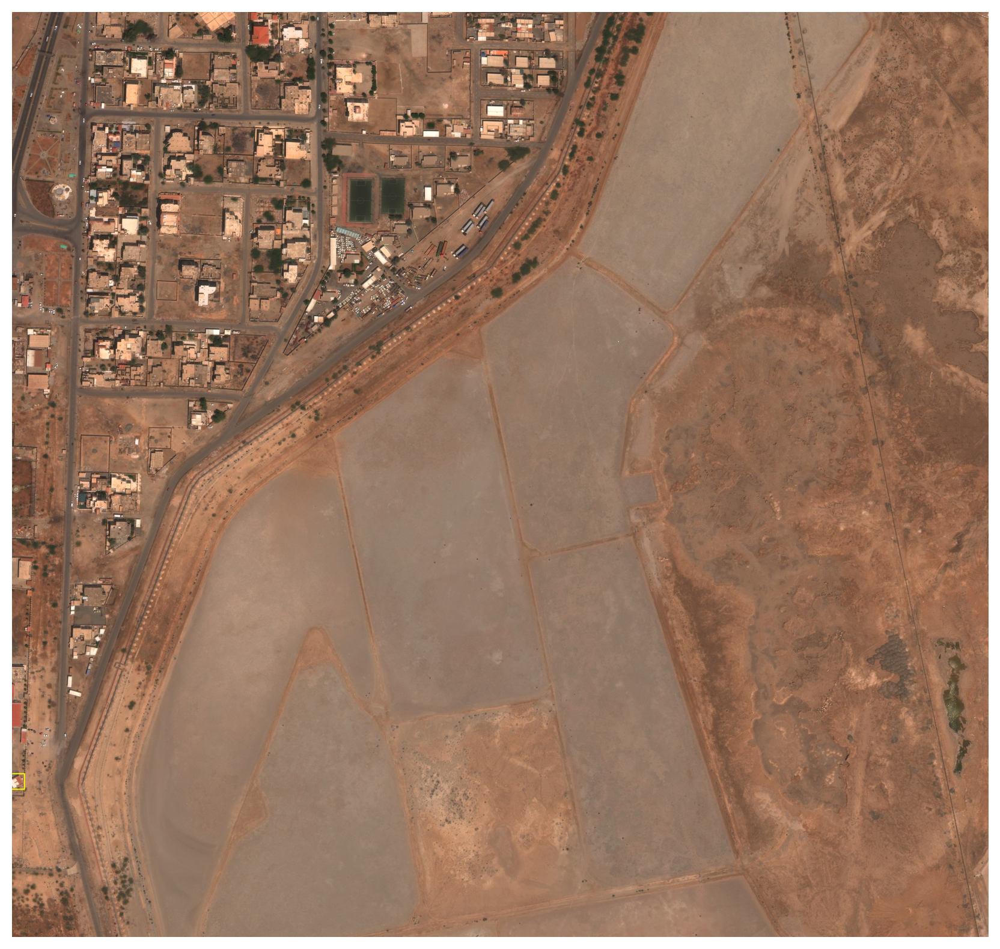

In [52]:
show_image_objects(df.iloc[5])

# Preprocessing

In [53]:
train_df, test_df = train_test_split(
  df, 
  test_size=0.2, 
  random_state=RANDOM_SEED
)

In [54]:
ANNOTATIONS_FILE = 'annotations.csv'
CLASSES_FILE = 'classes.csv'

In [55]:
train_df.to_csv(ANNOTATIONS_FILE, index=False, header=None)

In [65]:
print(XVIEW_CATEGORIES)
with open(CLASSES_FILE, 'w') as f:
  for i, line in XVIEW_CATEGORIES.values():
    f.write('{},{}\n'.format(line,i))

{13: 'CARGO_PLANE', 15: 'HELICOPTER', 18: 'SMALL_CAR', 19: 'BUS', 23: 'TRUCK', 41: 'MOTORBOAT', 47: 'FISHING_VESSEL', 60: 'DUMP_TRUCK', 64: 'EXCAVATOR', 73: 'BUILDING', 86: 'STORAGE_TANK', 91: 'SHIPPING_CONTAINER'}


ValueError: too many values to unpack (expected 2)

In [66]:
!head classes.csv

In [58]:
!head annotations.csv

/media/beegfs/home/u271/PROJECT/xview_detection/train/1584.tif,2028,1400,2042,1416,SMALL_CAR
/media/beegfs/home/u271/PROJECT/xview_detection/train/523.tif,121,2103,175,2146,BUILDING
/media/beegfs/home/u271/PROJECT/xview_detection/train/2269.tif,355,2267,367,2274,SMALL_CAR
/media/beegfs/home/u271/PROJECT/xview_detection/train/2371.tif,1214,1991,1276,2038,BUILDING
/media/beegfs/home/u271/PROJECT/xview_detection/train/2320.tif,1315,127,1358,159,BUILDING
/media/beegfs/home/u271/PROJECT/xview_detection/train/1450.tif,568,1189,582,1197,SMALL_CAR
/media/beegfs/home/u271/PROJECT/xview_detection/train/1919.tif,2702,2214,2800,2299,BUILDING
/media/beegfs/home/u271/PROJECT/xview_detection/train/523.tif,350,1794,364,1809,SMALL_CAR
/media/beegfs/home/u271/PROJECT/xview_detection/train/2509.tif,211,1247,244,1268,BUILDING
/media/beegfs/home/u271/PROJECT/xview_detection/train/1587.tif,384,750,405,765,BUILDING


# Training

In [ ]:
PRETRAINED_MODEL = './snapshots/_pretrained_model.h5'

URL_MODEL = 'https://github.com/fizyr/keras-retinanet/releases/download/0.5.1/resnet50_coco_best_v2.1.0.h5'
urllib.request.urlretrieve(URL_MODEL, PRETRAINED_MODEL)

print('Downloaded pretrained model to ' + PRETRAINED_MODEL)

Downloaded pretrained model to ./snapshots/_pretrained_model.h5


In [ ]:
!keras_retinanet/bin/train.py --freeze-backbone --random-transform --weights {PRETRAINED_MODEL} --batch-size 8 --steps 500 --epochs 10 csv annotations.csv classes.csv

Using TensorFlow backend.
Creating model, this may take a second...
2019-11-30 16:49:49.863266: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2019-11-30 16:49:49.911632: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:1006] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2019-11-30 16:49:49.912231: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1618] Found device 0 with properties: 
name: Tesla P100-PCIE-16GB major: 6 minor: 0 memoryClockRate(GHz): 1.3285
pciBusID: 0000:00:04.0
2019-11-30 16:49:49.920123: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.0
2019-11-30 16:49:50.120471: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcublas.so.10.0
2019-11-30 16:49:50.212758: I tensorflow/stream_executor/platfo

# Loading the trained model

In [ ]:
!ls snapshots

_pretrained_model.h5  resnet50_csv_04.h5  resnet50_csv_08.h5
resnet50_csv_01.h5    resnet50_csv_05.h5  resnet50_csv_09.h5
resnet50_csv_02.h5    resnet50_csv_06.h5  resnet50_csv_10.h5
resnet50_csv_03.h5    resnet50_csv_07.h5


In [ ]:
model_path = os.path.join('snapshots', sorted(os.listdir('snapshots'), reverse=True)[0])
print(model_path)

model = models.load_model(model_path, backbone_name='resnet50')
model = models.convert_model(model)

labels_to_names = pd.read_csv(CLASSES_FILE, header=None).T.loc[0].to_dict()

snapshots/resnet50_csv_10.h5
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-22.627417, -11.313708,  22.627417,  11.313708],
       [-28.50876 , -14.25438 ,  28.50876 ,  14.25438 ],
       [-35.918785, -17.959393,  35.918785,  17.959393],
       [-16.      , -16.      ,  16.      ,  16.      ],
       [-20.158737, -20.158737,  20.158737,  20.158737],
       [-25.398417, -25.398417,  25.398417,  25.398417],
       [-11.313708, -22.627417,  11.313708,  22.627417],
       [-14.25438 , -28.50876 ,  14.25438 ,  28.50876 ],
       [-17.959393, -35.918785,  17.959393,  35.918785]], dtype=float32)> anchors
tracking <tf.Variable 'Variable:0' shape=(9, 4) dtype=float32, numpy=
array([[-45.254833, -22.627417,  45.254833,  22.627417],
       [-57.01752 , -28.50876 ,  57.01752 ,  28.50876 ],
       [-71.83757 , -35.918785,  71.83757 ,  35.918785],
       [-32.      , -32.      ,  32.      ,  32.      ],
       [-40.317474, -40.317474,  40.317474,  40.317474],
       [

# Predictions

In [ ]:
def predict(image):
  image = preprocess_image(image.copy())
  image, scale = resize_image(image)

  boxes, scores, labels = model.predict_on_batch(
    np.expand_dims(image, axis=0)
  )

  boxes /= scale

  return boxes, scores, labels

In [ ]:
THRES_SCORE = 0.6

def draw_detections(image, boxes, scores, labels):
  for box, score, label in zip(boxes[0], scores[0], labels[0]):
    if score < THRES_SCORE:
        break

    color = label_color(label)

    b = box.astype(int)
    draw_box(image, b, color=color)

    caption = "{} {:.3f}".format(labels_to_names[label], score)
    draw_caption(image, b, caption)


In [ ]:
def show_detected_objects(image_row):
  img_path = image_row.image_name
  
  image = read_image_bgr(img_path)

  boxes, scores, labels = predict(image)

  draw = image.copy()
  draw = cv2.cvtColor(draw, cv2.COLOR_BGR2RGB)

  true_box = [
    image_row.x_min, image_row.y_min, image_row.x_max, image_row.y_max
  ]
  draw_box(draw, true_box, color=(255, 255, 0))

  draw_detections(draw, boxes, scores, labels)

  plt.axis('off')
  plt.imshow(draw)
  plt.show()

In [ ]:
test_df.head(n=10)

,image_name,x_min,y_min,x_max,y_max,class_name
115,number_plates/licensed_car_115.jpeg,48,74,599,188,license_plate
15,number_plates/licensed_car_15.jpeg,274,344,517,431,license_plate
211,number_plates/licensed_car_211.jpeg,157,89,382,160,license_plate
126,number_plates/licensed_car_126.jpeg,443,255,639,347,license_plate
6,number_plates/licensed_car_6.jpeg,227,241,444,315,license_plate
170,number_plates/licensed_car_170.jpeg,556,442,1746,1079,license_plate
9,number_plates/licensed_car_9.jpeg,674,365,958,572,license_plate
221,number_plates/licensed_car_221.jpeg,93,332,298,406,license_plate
112,number_plates/licensed_car_112.jpeg,22,50,499,362,license_plate
220,number_plates/licensed_car_220.jpeg,55,191,194,238,license_plate


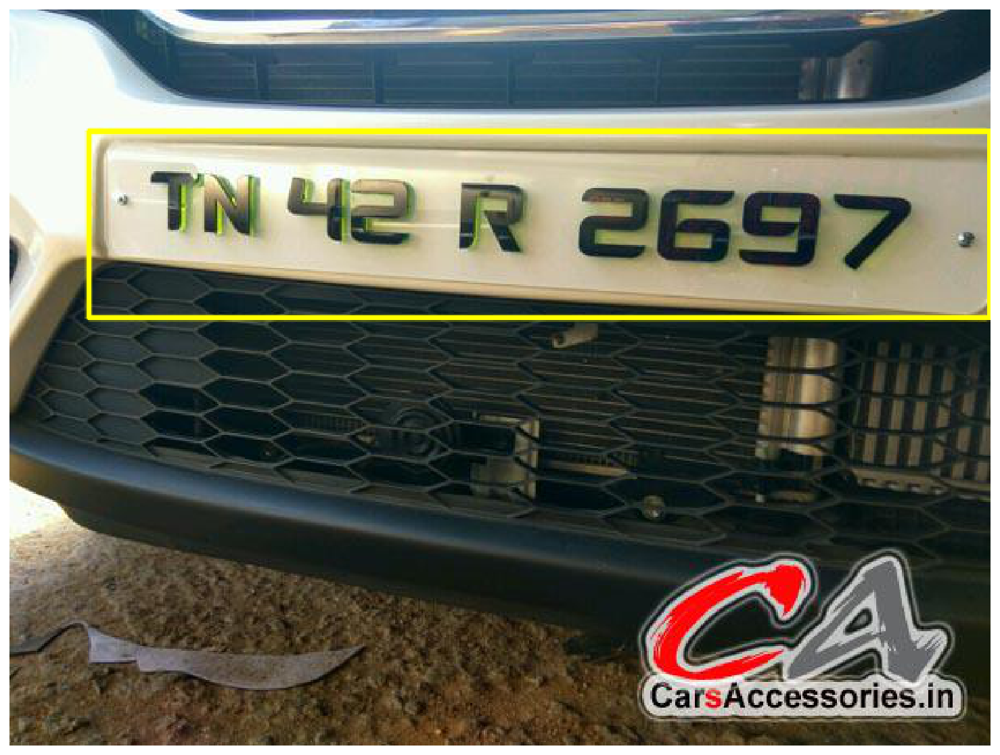

In [ ]:
show_detected_objects(test_df.iloc[0])

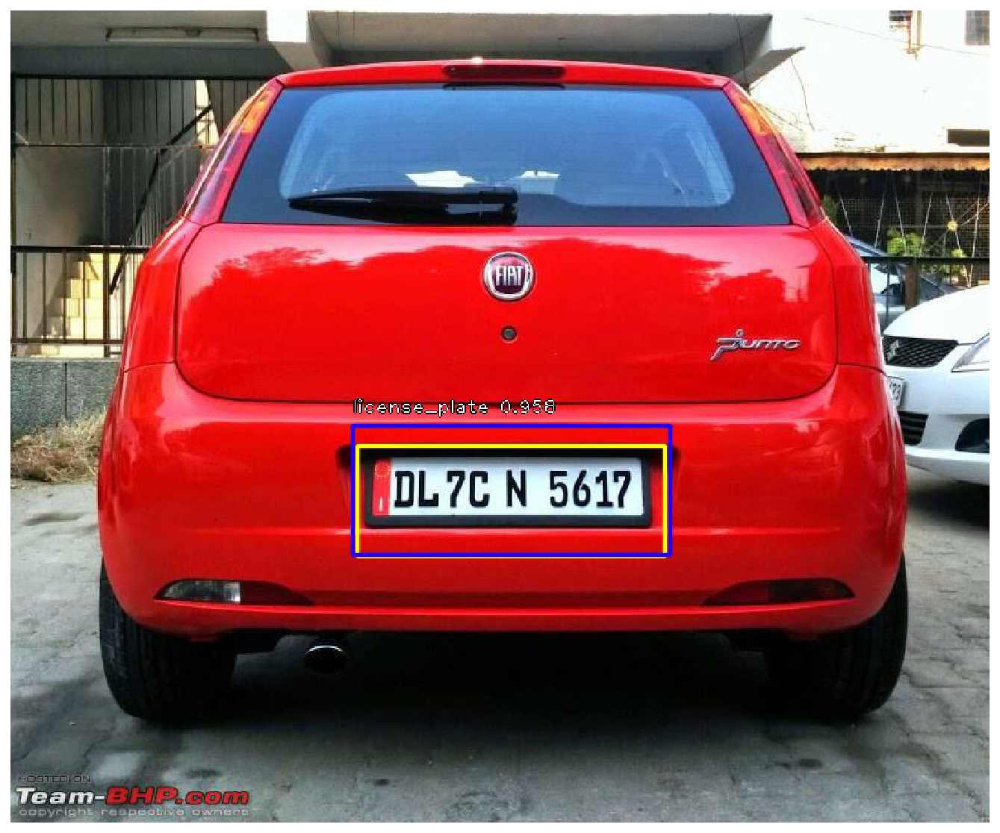

In [ ]:
show_detected_objects(test_df.iloc[1])

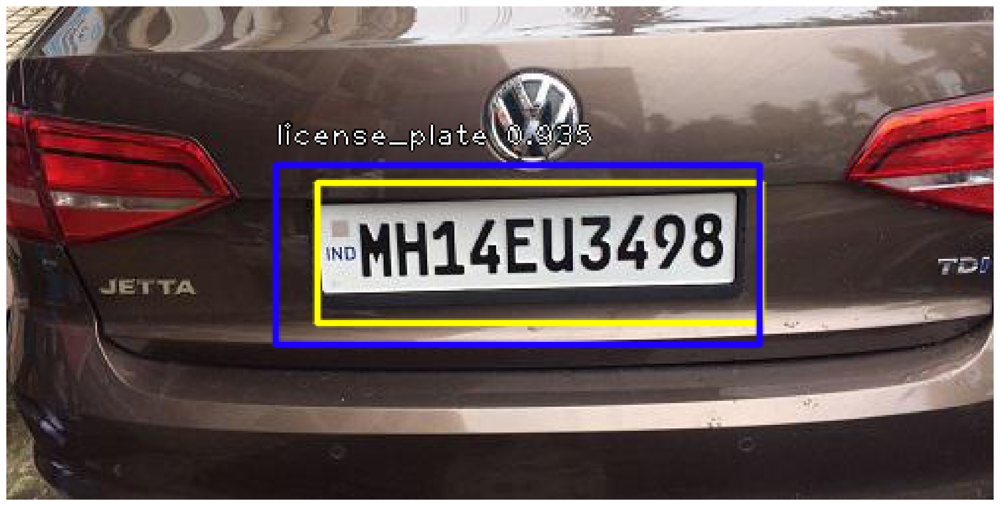

In [ ]:
show_detected_objects(test_df.iloc[2])